### **Inflorescence type analysis on *Spiraea* L.**

**Author: Yuxuan Liu**

---
### **Preparation 准备工作**

#### 1. Import required libraries 导入所需的库

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import scipy.stats as stats

#### 2. Import the trait data (csv file)

In [2]:
traits_data = pd.read_csv("./Data/Spiraea_Traits_data.csv", sep=",")
traits_data.head()

,Sect,Taxon,Inflorescence_type,Petal_color,Stamen_length,Branchlet_shape,Leaf_blade_margin
0,1.0,Spiraea_bella,1.0,2.0,1.0,1.0,1.0
1,1.0,Spiraea_fritschiana,1.0,1.0,3.0,1.0,1.0
2,1.0,Spiraea_morrisonicola_var._hayatana,1.0,1.0,3.0,2.0,1.0
3,1.0,Spiraea_hingshanensis,1.0,1.0,3.0,1.0,1.0
4,1.0,Spiraea_japonica,1.0,2.0,3.0,2.0,1.0


In [3]:
print(traits_data.shape)
traits_data.groupby('Inflorescence_type')['Inflorescence_type'].count()

(125, 7)


Inflorescence_type
1.0    35
2.0    20
3.0     6
4.0    34
5.0    14
6.0    13
Name: Inflorescence_type, dtype: int64

#### 3. Import the geo distribution data

In [4]:
# 读取CSV文件
geo_data = pd.read_csv('./Data/Final_native_distribution.csv')
print(geo_data.head())
print(geo_data.shape)

# 查看数据缺失值
print(geo_data.isnull().sum())

#查看数据重复值
print(geo_data.duplicated().sum())

#查看数据描述性统计
print(geo_data.describe())

#查看数据相关性

                                        Taxon   longitude   latitude
0  Spiraea_hypericifolia_subsp._hypericifolia  103.206643  34.258625
1  Spiraea_hypericifolia_subsp._hypericifolia  122.067042  46.077561
2  Spiraea_hypericifolia_subsp._hypericifolia  107.809316  51.908277
3  Spiraea_hypericifolia_subsp._hypericifolia  107.515604  51.232851
4  Spiraea_hypericifolia_subsp._hypericifolia  107.772356  51.087030
(52456, 3)
Taxon        0
longitude    0
latitude     0
dtype: int64
0
          longitude      latitude
count  52456.000000  52456.000000
mean     -22.661115     43.605990
std       98.540449      7.935443
min     -173.460300     22.342797
25%     -114.649465     40.725945
50%      -72.490162     44.465597
75%      100.298403     48.542726
max      178.965700     71.841440


#### 4. Add traits data to each record of geo distribution. 给每条分布记录中的物种添加对应性状信息

In [7]:
# 定义一个函数来提取属名和种名（到第二个下划线之前的部分）
def get_species_name(taxon):
    parts = taxon.split('_')
    if len(parts) >= 2:
        return '_'.join(parts[:2])
    return taxon

# 创建一个新的字典，使用处理后的种名作为键
mapping = {}
for taxon, inf_type in zip(traits_data['Taxon'], traits_data['Inflorescence_type']):
    species_name = get_species_name(taxon)
    mapping[species_name] = inf_type

# 为geo_data添加新列，使用处理后的种名进行匹配
geo_data['Species_Name'] = geo_data['Taxon'].apply(get_species_name)
geo_data['Inflorescence_type'] = geo_data['Species_Name'].map(mapping)
geo_data.to_excel('./Data/Spiraea_geo_inflorescence_type.xlsx', index=False)

In [6]:
# 分析匹配情况
matched_species = set(geo_data[geo_data['Inflorescence_type'].notna()]['Species_Name'].unique())
all_species = set(geo_data['Species_Name'].unique())
unmatched_species = all_species - matched_species

print("\n匹配到的物种：")
for species in sorted(matched_species):
    print(f"- {species}")

print("\n未匹配到的物种：")
for species in sorted(unmatched_species):
    print(f"- {species}")

print(f"\n总计：")
print(f"匹配到的物种数：{len(matched_species)}")
print(f"未匹配到的物种数：{len(unmatched_species)}")


匹配到的物种：
- Spiraea_adiantoides
- Spiraea_affinis
- Spiraea_alba
- Spiraea_alpina
- Spiraea_arcuata
- Spiraea_baldshuanica
- Spiraea_bella
- Spiraea_betulifolia
- Spiraea_blumei
- Spiraea_brahuica
- Spiraea_calcicola
- Spiraea_cana
- Spiraea_canescens
- Spiraea_cantoniensis
- Spiraea_cardotiana
- Spiraea_celtifolia
- Spiraea_chamaedryfolia
- Spiraea_chinensis
- Spiraea_compsophylla
- Spiraea_corymbosa
- Spiraea_crenata
- Spiraea_dahurica
- Spiraea_daochengensis
- Spiraea_dasyantha
- Spiraea_decumbens
- Spiraea_douglasii
- Spiraea_elegans
- Spiraea_fritschiana
- Spiraea_gracilis
- Spiraea_hailarensis
- Spiraea_henryi
- Spiraea_hingshanensis
- Spiraea_hirsuta
- Spiraea_hypericifolia
- Spiraea_hypoleuca
- Spiraea_insularis
- Spiraea_japonica
- Spiraea_kwangsiensis
- Spiraea_laeta
- Spiraea_lasiocarpa
- Spiraea_lichiangensis
- Spiraea_lobulata
- Spiraea_longigemmis
- Spiraea_lucida
- Spiraea_martini
- Spiraea_media
- Spiraea_micrantha
- Spiraea_miyabei
- Spiraea_mollifolia
- Spiraea_mongoli

---

### **Part 1 Draw the geographical distribution map of different inflorescence types of Spirea species**
### **绘制不同花序类型绣线菊属物种的地理分布图**

#### 1. Import the geographical distribution data of Spirea species of different inflorescence types 导入不同花序类型绣线菊属物种的地理分布数据

In [30]:
geo_trait_data = pd.read_excel('./Data/Spiraea_geo_inflorescence_type.xlsx',dtype={'Inflorescence_type': str})
geo_trait_data['Inflorescence_type'] = geo_trait_data['Inflorescence_type'].replace('1', 'Terminal_compound_corymbs')
geo_trait_data['Inflorescence_type'] = geo_trait_data['Inflorescence_type'].replace('2', 'Lateral_compound_corymbs')
geo_trait_data['Inflorescence_type'] = geo_trait_data['Inflorescence_type'].replace('3', 'Panicle')
geo_trait_data['Inflorescence_type'] = geo_trait_data['Inflorescence_type'].replace('4', 'Corymbs')
geo_trait_data['Inflorescence_type'] = geo_trait_data['Inflorescence_type'].replace('5', 'Umbel')
geo_trait_data['Inflorescence_type'] = geo_trait_data['Inflorescence_type'].replace('6', 'Fascicle')
geo_trait_data.head()

,Taxon,longitude,latitude,Species_Name,Inflorescence_type
0,Spiraea_hypericifolia_subsp._hypericifolia,103.206643,34.258625,Spiraea_hypericifolia,Fascicle
1,Spiraea_hypericifolia_subsp._hypericifolia,122.067042,46.077561,Spiraea_hypericifolia,Fascicle
2,Spiraea_hypericifolia_subsp._hypericifolia,107.809316,51.908277,Spiraea_hypericifolia,Fascicle
3,Spiraea_hypericifolia_subsp._hypericifolia,107.515604,51.232851,Spiraea_hypericifolia,Fascicle
4,Spiraea_hypericifolia_subsp._hypericifolia,107.772356,51.087030,Spiraea_hypericifolia,Fascicle


#### 2. 绘制所有绣线菊属物种的全球分布图，其中不同花序类型用不同颜色表示 Draw a global distribution map of all species of the genus Spirea, with different types of inflorescences represented by different colors

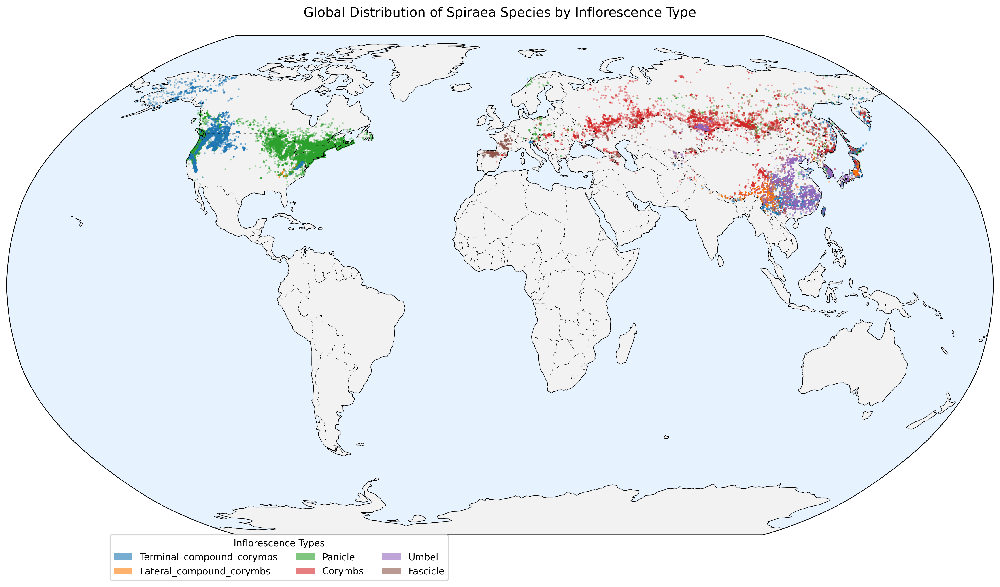

In [41]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Patch
import numpy as np

# 设置图形大小和分辨率
plt.figure(figsize=(15, 10), dpi=300)

# 创建地图投影
ax = plt.axes(projection=ccrs.Robinson())

# 添加自然地球特征
ax.add_feature(cfeature.LAND, facecolor='#f2f2f2', edgecolor='#cccccc')
ax.add_feature(cfeature.OCEAN, facecolor='#e6f3ff')
ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.5)

# 设置地图范围（可根据数据分布调整）
ax.set_global()

# 使用之前定义的颜色方案
# colors = ['#2166AC', '#4393C3', '#92C5DE', '#F4A582', '#D6604D', '#B2182B']
# colors = ['#ef3b3b', '#e4739c', '#fec6ce', '#62c4a0', '#bee2a5', '#cfcfcf']
colors = ['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728', '#9467BD', '#8C564B']
data_inflo_type = ['Terminal_compound_corymbs', 'Lateral_compound_corymbs', 'Panicle', 'Corymbs', 'Umbel', 'Fascicle']
color_dict = dict(zip(data_inflo_type, colors))

# 为每种花序类型绘制散点
for inflo_type in geo_trait_data['Inflorescence_type'].unique():
    data = geo_trait_data[geo_trait_data['Inflorescence_type'] == inflo_type]
    ax.scatter(data['longitude'], data['latitude'],
              c=[color_dict[inflo_type]],
              marker='o',
            # edgecolor='w',
              s=1,  # 点的大小
              alpha=0.3,  # 透明度
              label=inflo_type,
              transform=ccrs.PlateCarree())

# 添加图例
legend_elements = [Patch(facecolor=color_dict[inflo_type], 
                        alpha=0.6,
                        label=inflo_type)
                  for inflo_type in color_dict.keys()]
ax.legend(handles=legend_elements,
         loc='lower left',
         bbox_to_anchor=(0.1, -0.1),
         ncol=3,
         frameon=True,
         title='Inflorescence Types')

# 添加经纬度网格
# ax.gridlines(linewidth=0.2, linestyle='--', color='gray', alpha=0.5)

# 设置标题
plt.title('Global Distribution of Spiraea Species by Inflorescence Type',
          pad=20, fontsize=14)

# 调整布局
plt.tight_layout()

# 保存图片（可选）
plt.savefig('Spiraea_distribution_map.png', 
            dpi=300, 
            bbox_inches='tight',
            facecolor='white',
            edgecolor='none')

plt.show()

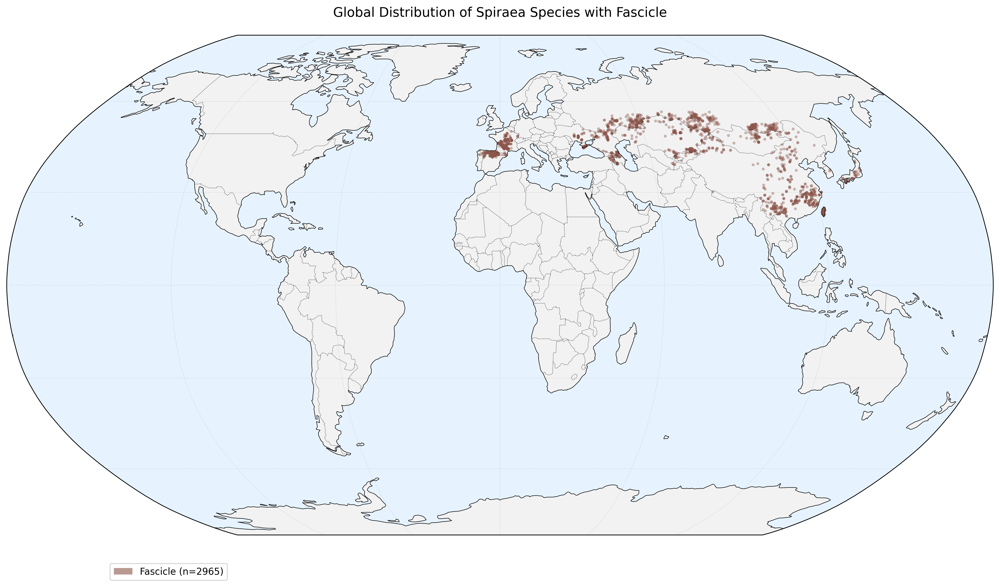

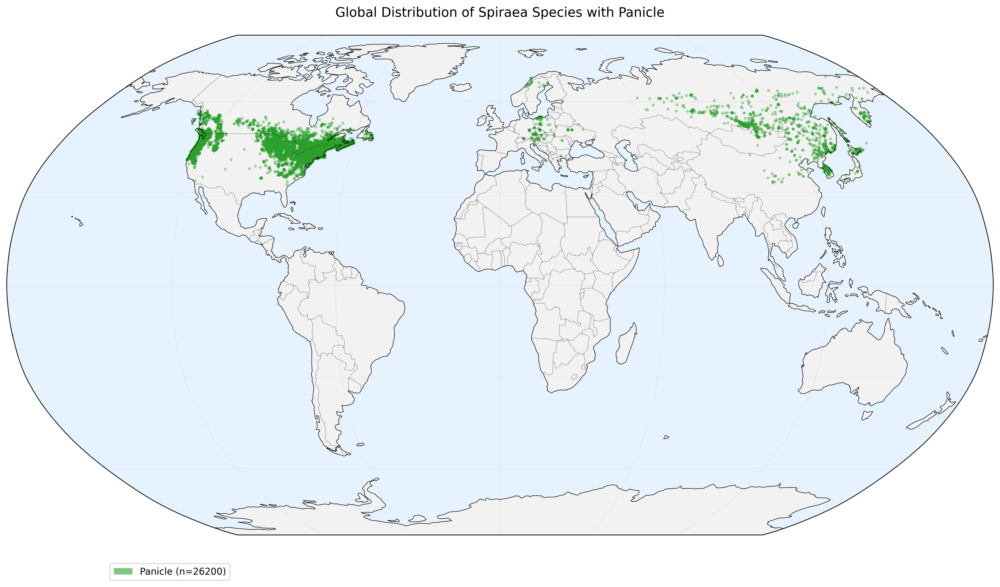

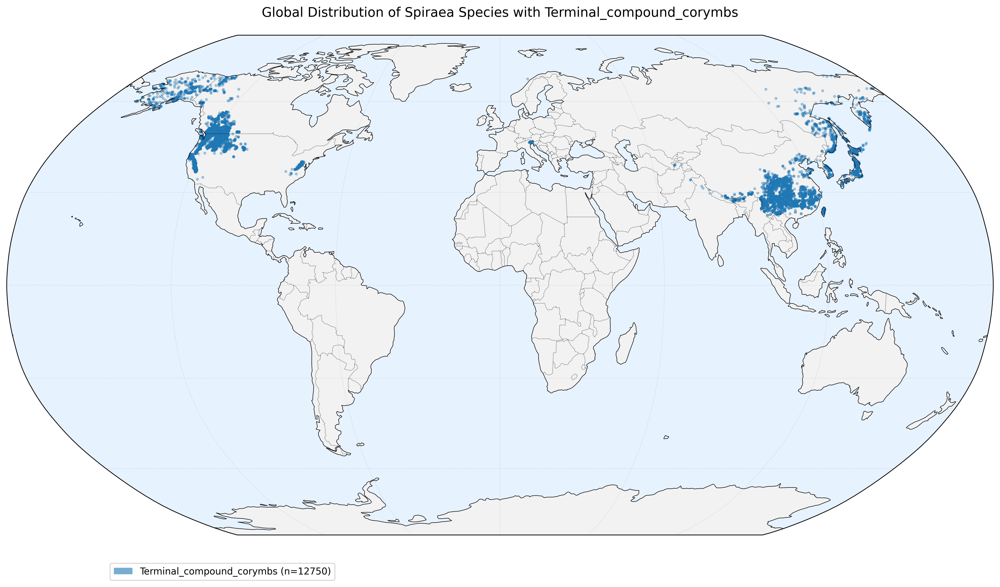

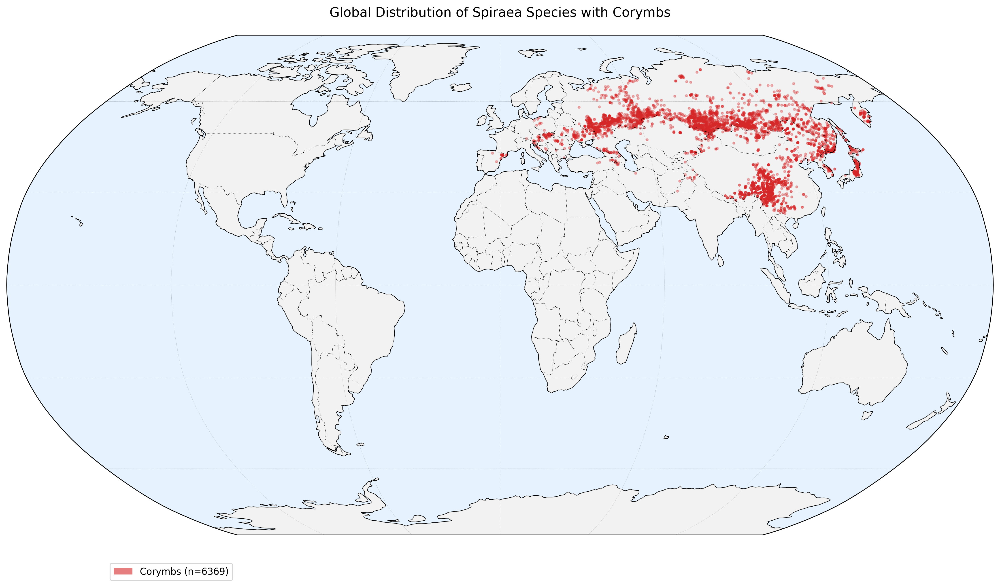

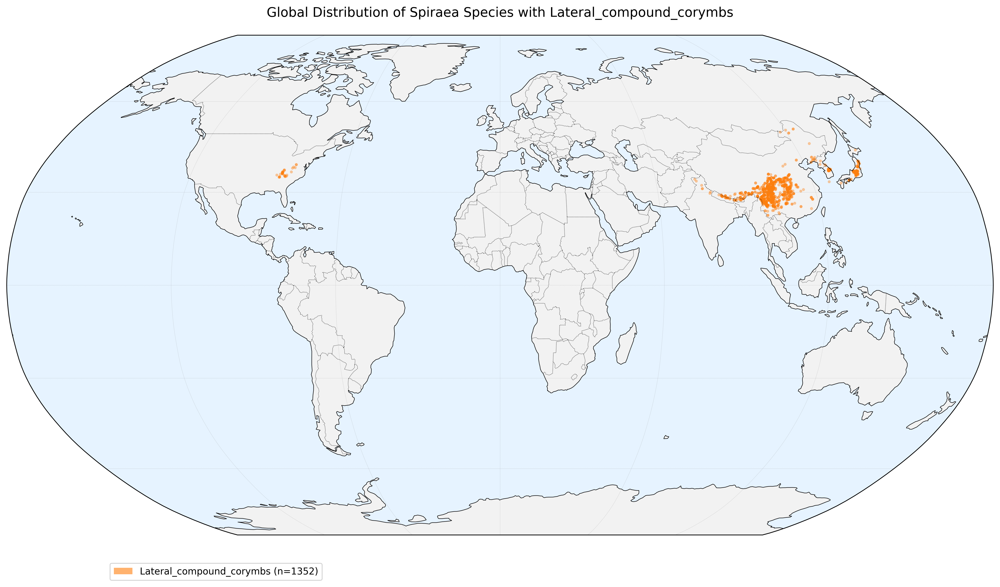

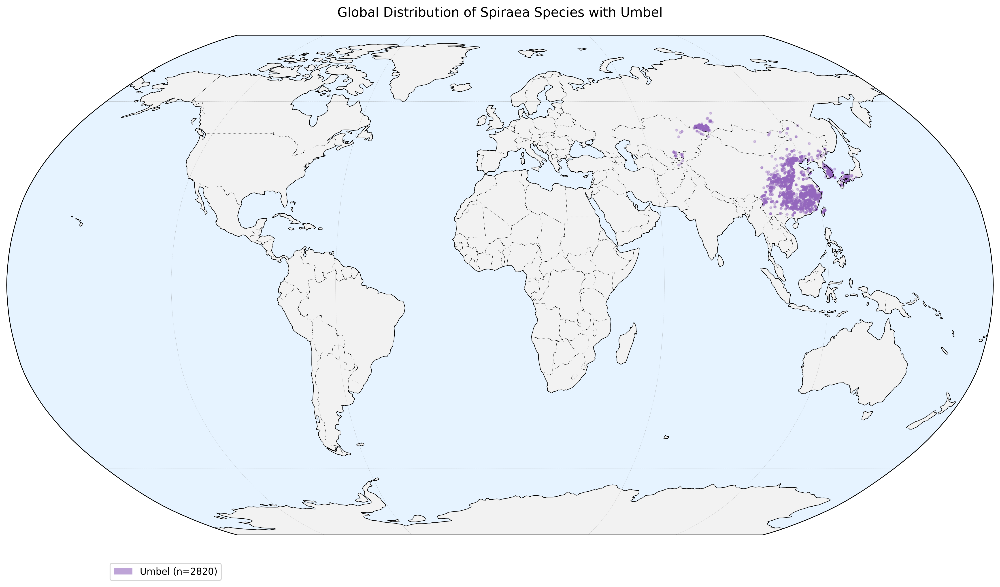


样本数量统计：
Panicle: 26200 个记录
Terminal_compound_corymbs: 12750 个记录
Corymbs: 6369 个记录
Fascicle: 2965 个记录
Umbel: 2820 个记录
Lateral_compound_corymbs: 1352 个记录


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Patch
import numpy as np

# 获取所有花序类型
inflo_types = geo_trait_data['Inflorescence_type'].unique()

# 为每种花序类型创建单独的图
for inflo_type in inflo_types:
    # 设置图形大小和分辨率
    plt.figure(figsize=(15, 10), dpi=300)
    
    # 创建地图投影
    ax = plt.axes(projection=ccrs.Robinson())
    
    # 添加自然地球特征
    ax.add_feature(cfeature.LAND, facecolor='#f2f2f2', edgecolor='#cccccc')
    ax.add_feature(cfeature.OCEAN, facecolor='#e6f3ff')
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.5)
    
    # 设置地图范围
    ax.set_global()
    
    # 获取当前花序类型的数据
    data = geo_trait_data[geo_trait_data['Inflorescence_type'] == inflo_type]
    
    # 获取该花序类型对应的颜色
    colors = ['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728', '#9467BD', '#8C564B']
    data_inflo_type = ['Terminal_compound_corymbs', 'Lateral_compound_corymbs', 'Panicle', 'Corymbs', 'Umbel', 'Fascicle']
    color = colors[data_inflo_type.index(inflo_type)]
    
    # 绘制散点
    ax.scatter(data['longitude'], data['latitude'],
              c=color,
              s=5,  # 点的大小
              alpha=0.3,  # 透明度
              label=inflo_type,
              transform=ccrs.PlateCarree())
    
    # 添加图例
    legend_element = [Patch(facecolor=color,
                           alpha=0.6,
                           label=f"{inflo_type} (n={len(data)})")]
    ax.legend(handles=legend_element,
             loc='lower left',
             bbox_to_anchor=(0.1, -0.1),
             frameon=True)
    
    # 添加经纬度网格
    # ax.gridlines(linewidth=0.2, linestyle='--', color='gray', alpha=0.5)
    
    # 设置标题
    plt.title(f'Global Distribution of Spiraea Species with {inflo_type}',
             pad=20, fontsize=14)
    
    # 调整布局
    plt.tight_layout()
    
    # 保存图片
    plt.savefig(f'Spiraea_distribution_{inflo_type.replace(" ", "_")}.png', 
                dpi=300, 
                bbox_inches='tight',
                facecolor='white',
                edgecolor='none')
    
    plt.show()

# 输出每种花序类型的样本数量统计
print("\n样本数量统计：")
sample_counts = geo_trait_data['Inflorescence_type'].value_counts()
for inflo_type, count in sample_counts.items():
    print(f"{inflo_type}: {count} 个记录")

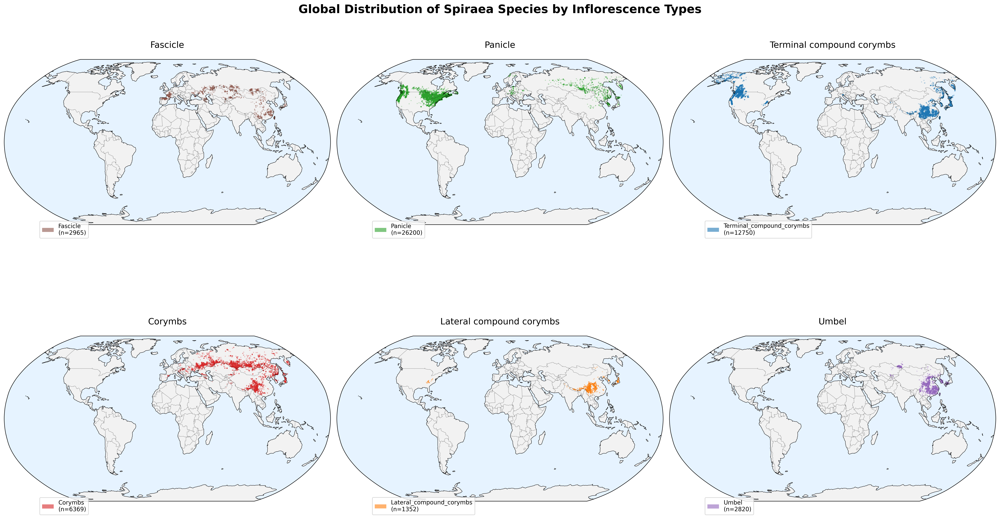


样本数量统计：
Panicle: 26200 个记录
Terminal_compound_corymbs: 12750 个记录
Corymbs: 6369 个记录
Fascicle: 2965 个记录
Umbel: 2820 个记录
Lateral_compound_corymbs: 1352 个记录


In [32]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Patch
import numpy as np

# 获取所有花序类型
inflo_types = geo_trait_data['Inflorescence_type'].unique()

# 创建2x3的子图布局
fig = plt.figure(figsize=(24, 16), dpi=300)

# 为每种花序类型创建子图
for idx, inflo_type in enumerate(inflo_types, 1):
    # 创建子图
    ax = fig.add_subplot(2, 3, idx, projection=ccrs.Robinson())
    
    # 添加自然地球特征
    ax.add_feature(cfeature.LAND, facecolor='#f2f2f2', edgecolor='#cccccc')
    ax.add_feature(cfeature.OCEAN, facecolor='#e6f3ff')
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.5)
    
    # 设置地图范围
    ax.set_global()
    
    # 获取当前花序类型的数据
    data = geo_trait_data[geo_trait_data['Inflorescence_type'] == inflo_type]
    
    # 获取该花序类型对应的颜色
    color = color_dict[inflo_type]
    
    # 绘制散点
    ax.scatter(data['longitude'], data['latitude'],
              c=color,
              s=1,  # 点的大小
              alpha=0.2,  # 透明度
              label=inflo_type,
              transform=ccrs.PlateCarree())
    
    # 添加图例
    legend_element = [Patch(facecolor=color,
                           alpha=0.6,
                           label=f"{inflo_type}\n(n={len(data)})")]
    ax.legend(handles=legend_element,
             loc='lower left',
             bbox_to_anchor=(0.1, -0.1),
             frameon=True,
             fontsize=10)
    
    # 添加经纬度网格
    #ax.gridlines(linewidth=0.2, linestyle='--', color='gray', alpha=0.5)
    
    # 设置子图标题
    ax.set_title(f'{inflo_type.replace("_", " ")}',
                pad=20, 
                fontsize=15)

# 添加总标题
fig.suptitle('Global Distribution of Spiraea Species by Inflorescence Types',
             fontsize=20,
             fontweight='bold',  # 加粗标题
             y=0.9)

# 调整子图之间的间距
plt.tight_layout()

# 保存图片
plt.savefig('Spiraea_distribution_all_types.png', 
            dpi=300, 
            bbox_inches='tight',
            facecolor='white',
            edgecolor='none')

plt.show()

# 输出每种花序类型的样本数量统计
print("\n样本数量统计：")
sample_counts = geo_trait_data['Inflorescence_type'].value_counts()
for inflo_type, count in sample_counts.items():
    print(f"{inflo_type}: {count} 个记录")

---
#### Part 2 Execute ANOVA analysis on all inflorescence types' latitude 对所有花序类型的纬度进行方差分析

<Axes: xlabel='Inflorescence_type'>

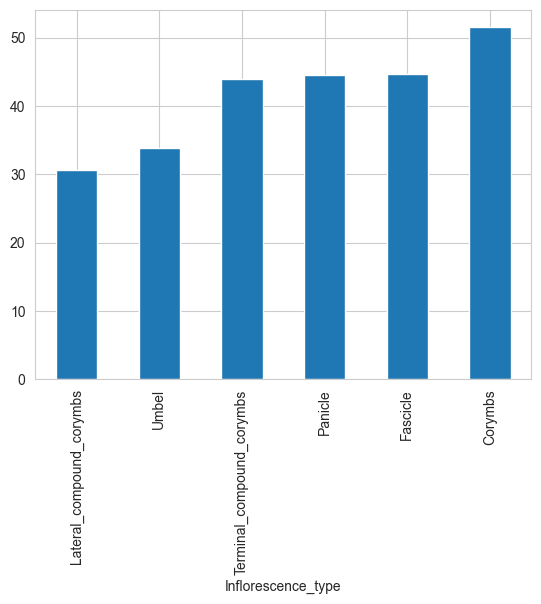

In [6]:
geo_trait_data.groupby('Inflorescence_type')["latitude"].median().sort_values().plot(kind='bar')

d:\Tools-bioinformatics\Anaconda\envs\python_nus\Lib\site-packages\scipy\stats\_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 12750.
  res = hypotest_fun_out(*samples, **kwds)
d:\Tools-bioinformatics\Anaconda\envs\python_nus\Lib\site-packages\scipy\stats\_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 26200.
  res = hypotest_fun_out(*samples, **kwds)
d:\Tools-bioinformatics\Anaconda\envs\python_nus\Lib\site-packages\scipy\stats\_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 6369.
  res = hypotest_fun_out(*samples, **kwds)


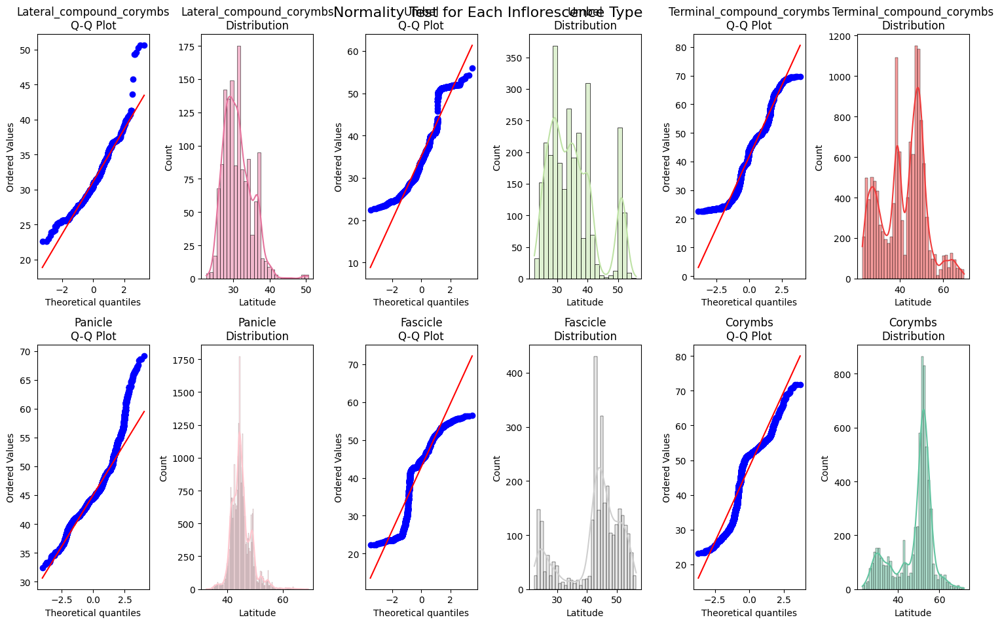


Shapiro-Wilk正态性检验结果：
-----------------------------------

Lateral_compound_corymbs:
样本量: 1352
Shapiro-Wilk统计量: 0.9530
p值: 2.0609e-20
是否服从正态分布: 否 (α=0.05)
-----------------------------------

Umbel:
样本量: 2820
Shapiro-Wilk统计量: 0.9119
p值: 1.1621e-37
是否服从正态分布: 否 (α=0.05)
-----------------------------------

Terminal_compound_corymbs:
样本量: 12750
Shapiro-Wilk统计量: 0.9636
p值: 2.2987e-48
是否服从正态分布: 否 (α=0.05)
-----------------------------------

Panicle:
样本量: 26200
Shapiro-Wilk统计量: 0.9375
p值: 3.2136e-72
是否服从正态分布: 否 (α=0.05)
-----------------------------------

Fascicle:
样本量: 2965
Shapiro-Wilk统计量: 0.8672
p值: 1.1730e-44
是否服从正态分布: 否 (α=0.05)
-----------------------------------

Corymbs:
样本量: 6369
Shapiro-Wilk统计量: 0.8713
p值: 3.2999e-58
是否服从正态分布: 否 (α=0.05)
-----------------------------------

分析建议：
以下花序类型的数据分布显著偏离正态分布：Lateral_compound_corymbs, Umbel, Terminal_compound_corymbs, Panicle, Fascicle, Corymbs
建议：
1. 考虑使用非参数检验方法（如Kruskal-Wallis检验）替代ANOVA
2. 或对数据进行转换（如对数转换、Box-Cox转换等）后再进行ANOVA


In [10]:
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import shapiro

median_order = (geo_trait_data.groupby('Inflorescence_type')['latitude']
               .median()
               .sort_values()
               .index.tolist())

# 创建一个2x3的子图布局用于Q-Q图和直方图
fig, axes = plt.subplots(2, 6, figsize=(15, 10))
fig.suptitle('Normality Test for Each Inflorescence Type', fontsize=16, y=0.95)

# 存储检验结果
normality_results = []

# 对每种花序类型进行检验
for idx, inflo_type in enumerate(median_order):
    data = geo_trait_data[geo_trait_data['Inflorescence_type'] == inflo_type]['latitude']
    
    # 进行Shapiro-Wilk检验
    statistic, p_value = shapiro(data)
    normality_results.append({
        'Inflorescence_type': inflo_type,
        'Sample_size': len(data),
        'Shapiro_statistic': statistic,
        'p_value': p_value,
        'Is_normal': p_value > 0.05
    })
    
    # 绘制Q-Q图
    row = (idx * 2) // 6
    col = (idx * 2) % 6
    
    # Q-Q图
    stats.probplot(data, dist="norm", plot=axes[row, col])
    axes[row, col].set_title(f'{inflo_type}\nQ-Q Plot')
    
    # 直方图和密度曲线
    row = (idx * 2 + 1) // 6
    col = (idx * 2 + 1) % 6
    sns.histplot(data=data, ax=axes[row, col], kde=True, color=color_dict[inflo_type])
    axes[row, col].set_title(f'{inflo_type}\nDistribution')
    axes[row, col].set_xlabel('Latitude')

# 调整布局
plt.tight_layout()

# 显示图形
plt.show()

# 打印检验结果
print("\nShapiro-Wilk正态性检验结果：")
print("-----------------------------------")
for result in normality_results:
    print(f"\n{result['Inflorescence_type']}:")
    print(f"样本量: {result['Sample_size']}")
    print(f"Shapiro-Wilk统计量: {result['Shapiro_statistic']:.4f}")
    print(f"p值: {result['p_value']:.4e}")
    print(f"是否服从正态分布: {'是' if result['Is_normal'] else '否'} (α=0.05)")
    print("-----------------------------------")

# 总结建议
print("\n分析建议：")
if all(result['Is_normal'] for result in normality_results):
    print("所有组都服从正态分布，可以直接进行ANOVA分析。")
else:
    non_normal = [result['Inflorescence_type'] for result in normality_results if not result['Is_normal']]
    print(f"以下花序类型的数据分布显著偏离正态分布：{', '.join(non_normal)}")
    print("建议：")
    print("1. 考虑使用非参数检验方法（如Kruskal-Wallis检验）替代ANOVA")
    print("2. 或对数据进行转换（如对数转换、Box-Cox转换等）后再进行ANOVA")

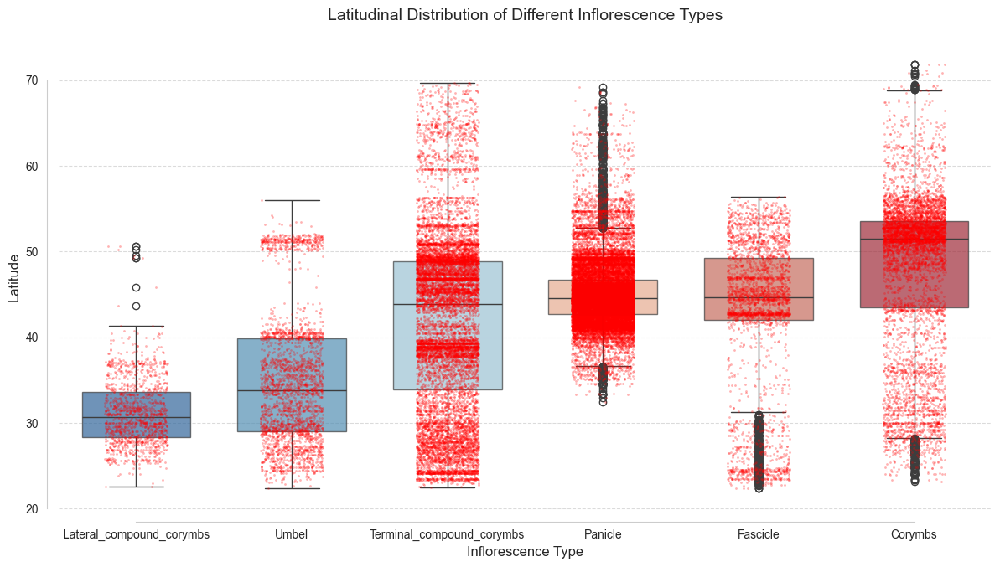


各花序类型的纬度分布统计：
                             count   mean    std    min    25%    50%    75%  \
Inflorescence_type                                                             
Corymbs                     6369.0  48.04   9.25  23.13  43.45  51.50  53.60   
Fascicle                    2965.0  42.85   8.98  22.34  42.04  44.63  49.28   
Lateral_compound_corymbs    1352.0  31.16   3.83  22.55  28.31  30.69  33.58   
Panicle                    26200.0  45.06   3.69  32.42  42.67  44.54  46.71   
Terminal_compound_corymbs  12750.0  41.78  10.20  22.51  33.91  43.89  48.87   
Umbel                       2820.0  35.07   7.87  22.42  29.03  33.80  39.86   

                             max  
Inflorescence_type                
Corymbs                    71.84  
Fascicle                   56.44  
Lateral_compound_corymbs   50.59  
Panicle                    69.16  
Terminal_compound_corymbs  69.67  
Umbel                      55.99  


In [5]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 设置seaborn样式
sns.set_style("whitegrid")

# 计算每种花序类型的中位数并排序
median_order = (geo_trait_data.groupby('Inflorescence_type')['latitude']
               .median()
               .sort_values()
               .index.tolist())

# 设置科研配色方案
colors = ['#2166AC', '#4393C3', '#92C5DE', '#F4A582', '#D6604D', '#B2182B']
color_dict = dict(zip(median_order, colors))

# 创建图形
plt.figure(figsize=(12, 8))

# 创建箱线图
ax = sns.boxplot(x='Inflorescence_type', 
                 y='latitude', 
                 data=geo_trait_data,
                 order=median_order,
                 hue='Inflorescence_type',  # 使用hue替代palette
                 palette=color_dict,
                 width=0.7,
                 legend=False,  # 不显示图例
                 boxprops={'alpha': 0.7})

# 使用stripplot替代swarmplot来显示所有数据点
sns.stripplot(x='Inflorescence_type', 
             y='latitude', 
             data=geo_trait_data,
             order=median_order,
             color='red',
             size=2,  # 减小点的大小
             alpha=0.3,  # 降低透明度
             jitter=0.2)  # 添加随机抖动以减少重叠

# 设置图表样式
plt.title('Latitudinal Distribution of Different Inflorescence Types', 
         fontsize=14, 
         pad=20)
plt.xlabel('Inflorescence Type', fontsize=12)
plt.ylabel('Latitude', fontsize=12)

# 旋转x轴标签
plt.xticks(rotation=45, ha='right')

# 调整布局
plt.tight_layout()

# 添加网格线
ax.yaxis.grid(True, linestyle='--', alpha=0.7)

# 美化边框
sns.despine(offset=10, trim=True)

plt.show()

# 输出统计信息
print("\n各花序类型的纬度分布统计：")
stats_summary = geo_trait_data.groupby('Inflorescence_type')['latitude'].describe()
print(stats_summary.round(2))

In [11]:
import numpy as np
from scipy import stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# 1. 对数转换（确保无0或负值，若有需先偏移）
geo_trait_data['log_latitude'] = np.log(geo_trait_data['latitude'] + 1)  # +1防止取log(0)

# 2. 检查转换后的正态性（可选）
for name, group in geo_trait_data.groupby('Inflorescence_type'):
    _, p_norm = stats.shapiro(group['log_latitude'])
    print(f"Shapiro-Wilk test for {name} (log-transformed): p = {p_norm:.4f}")

# 3. 方差齐性检验（Levene's test）
lev_stat, lev_p = stats.levene(*[group['log_latitude'].values 
                               for name, group in geo_trait_data.groupby('Inflorescence_type')])
print(f"\nLevene's test (方差齐性): p = {lev_p:.4f}")

# 4. 执行ANOVA
inflo_groups_log = [group['log_latitude'].values 
                   for name, group in geo_trait_data.groupby('Inflorescence_type')]
f_stat, p_val = stats.f_oneway(*inflo_groups_log)

print("\nOne-way ANOVA Results (log-transformed data):")
print(f"F-statistic: {f_stat:.4f}")
print(f"p-value: {p_val:.4e}")

# 5. 事后检验（若显著）
if p_val < 0.05:
    print("\nPerforming Tukey's HSD test on log-transformed data...")
    tukey = pairwise_tukeyhsd(
        endog=geo_trait_data['log_latitude'],
        groups=geo_trait_data['Inflorescence_type'],
        alpha=0.05
    )
    print(tukey)

# 6. 描述性统计（转换后）
print("\nDescriptive Stats (log-transformed):")
print(geo_trait_data.groupby('Inflorescence_type')['log_latitude'].describe())


d:\Tools-bioinformatics\Anaconda\envs\python_nus\Lib\site-packages\scipy\stats\_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 6369.
  res = hypotest_fun_out(*samples, **kwds)
d:\Tools-bioinformatics\Anaconda\envs\python_nus\Lib\site-packages\scipy\stats\_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 26200.
  res = hypotest_fun_out(*samples, **kwds)
d:\Tools-bioinformatics\Anaconda\envs\python_nus\Lib\site-packages\scipy\stats\_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 12750.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk test for Corymbs (log-transformed): p = 0.0000
Shapiro-Wilk test for Fascicle (log-transformed): p = 0.0000
Shapiro-Wilk test for Lateral_compound_corymbs (log-transformed): p = 0.0000
Shapiro-Wilk test for Panicle (log-transformed): p = 0.0000
Shapiro-Wilk test for Terminal_compound_corymbs (log-transformed): p = 0.0000
Shapiro-Wilk test for Umbel (log-transformed): p = 0.0000

Levene's test (方差齐性): p = 0.0000

One-way ANOVA Results (log-transformed data):
F-statistic: 2786.6774
p-value: 0.0000e+00

Performing Tukey's HSD test on log-transformed data...
                   Multiple Comparison of Means - Tukey HSD, FWER=0.05                   
          group1                    group2          meandiff p-adj  lower   upper  reject
-----------------------------------------------------------------------------------------
                  Corymbs                  Fascicle  -0.1162   0.0 -0.1272 -0.1052   True
                  Corymbs  Lateral_compound_corymbs  -0.4075   0.0

Optimal lambda for Box-Cox transformation: 1.7145
Shapiro-Wilk test for Corymbs (Box-Cox transformed): p = 0.0000
Shapiro-Wilk test for Fascicle (Box-Cox transformed): p = 0.0000
Shapiro-Wilk test for Lateral_compound_corymbs (Box-Cox transformed): p = 0.0000
Shapiro-Wilk test for Panicle (Box-Cox transformed): p = 0.0000
Shapiro-Wilk test for Terminal_compound_corymbs (Box-Cox transformed): p = 0.0000
Shapiro-Wilk test for Umbel (Box-Cox transformed): p = 0.0000


d:\Tools-bioinformatics\Anaconda\envs\python_nus\Lib\site-packages\scipy\stats\_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 6369.
  res = hypotest_fun_out(*samples, **kwds)
d:\Tools-bioinformatics\Anaconda\envs\python_nus\Lib\site-packages\scipy\stats\_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 26200.
  res = hypotest_fun_out(*samples, **kwds)
d:\Tools-bioinformatics\Anaconda\envs\python_nus\Lib\site-packages\scipy\stats\_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 12750.
  res = hypotest_fun_out(*samples, **kwds)


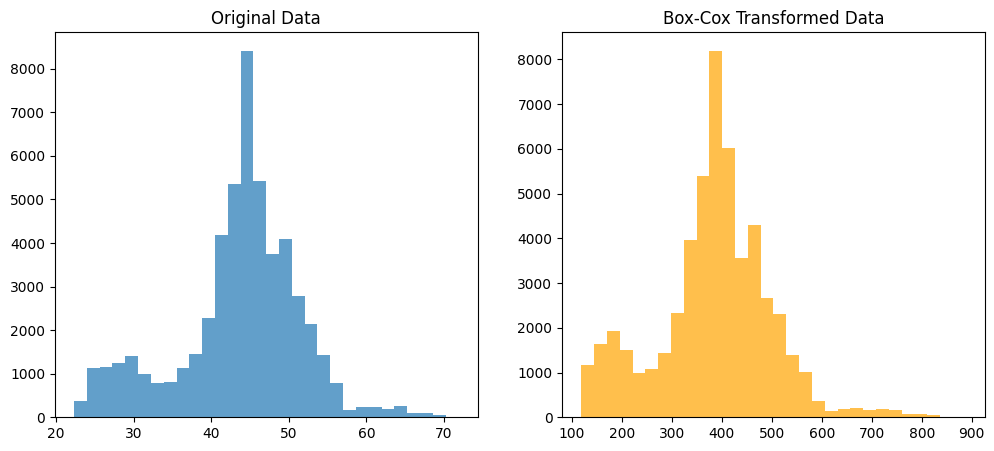

In [14]:
import numpy as np
from scipy import stats
from scipy.stats import boxcox
import matplotlib.pyplot as plt

# 检查是否有非正值（Box-Cox要求严格正值）
if (geo_trait_data['latitude'] <= 0).any():
    # 若存在非正值，整体加上一个偏移量（确保所有值 > 0）
    offset = -geo_trait_data['latitude'].min() + 1e-5  # 加一个小常数避免零
    geo_trait_data['latitude_shifted'] = geo_trait_data['latitude'] + offset
    data_to_transform = geo_trait_data['latitude_shifted']
else:
    data_to_transform = geo_trait_data['latitude']

# 对整体数据寻找最优lambda（假设各组需要相同的变换）
transformed_data, lambda_optimal = boxcox(data_to_transform)
geo_trait_data['latitude_boxcox'] = transformed_data

print(f"Optimal lambda for Box-Cox transformation: {lambda_optimal:.4f}")

# 对每组变换后的数据做Shapiro-Wilk检验
for name, group in geo_trait_data.groupby('Inflorescence_type'):
    _, p_value = stats.shapiro(group['latitude_boxcox'])
    print(f"Shapiro-Wilk test for {name} (Box-Cox transformed): p = {p_value:.4f}")

# 可视化变换前后的对比
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.hist(data_to_transform, bins=30, alpha=0.7)
plt.title("Original Data")
plt.subplot(1, 2, 2)
plt.hist(transformed_data, bins=30, alpha=0.7, color='orange')
plt.title("Box-Cox Transformed Data")
plt.show()


In [15]:
# 方差齐性检验（Levene's test）
lev_stat, lev_p = stats.levene(*[group['latitude_boxcox'].values 
                               for name, group in geo_trait_data.groupby('Inflorescence_type')])
print(f"Levene's test p-value: {lev_p:.4f}")

# 若方差齐性（p > 0.05），执行ANOVA
if lev_p > 0.05:
    f_stat, p_val = stats.f_oneway(*[group['latitude_boxcox'].values 
                                   for name, group in geo_trait_data.groupby('Inflorescence_type')])
    print(f"ANOVA F-statistic: {f_stat:.4f}, p-value: {p_val:.4e}")
    
    # 事后检验（Tukey HSD）
    if p_val < 0.05:
        from statsmodels.stats.multicomp import pairwise_tukeyhsd
        tukey = pairwise_tukeyhsd(
            endog=geo_trait_data['latitude_boxcox'],
            groups=geo_trait_data['Inflorescence_type'],
            alpha=0.05
        )
        print(tukey)
else:
    print("警告：方差齐性不满足，即使正态性满足，ANOVA结果可能不可靠。")


Levene's test p-value: 0.0000
警告：方差齐性不满足，即使正态性满足，ANOVA结果可能不可靠。


In [20]:
import scikit_posthocs as sp
# Kruskal-Wallis检验（无需正态假设）
h_stat, p_val = stats.kruskal(*[group['latitude'].values 
                              for name, group in geo_trait_data.groupby('Inflorescence_type')])
print(f"Kruskal-Wallis H-statistic: {h_stat:.4f}, p-value: {p_val:.4e}")

if p_val < 0.05:
    dunn_result = sp.posthoc_dunn(
        geo_trait_data,
        val_col='latitude',
        group_col='Inflorescence_type',
        p_adjust='bonferroni'
    )
    
    print("\nDunn's test results (significant pairs only):")
    # 获取所有组名
    groups = dunn_result.columns.tolist()
    # 遍历矩阵的上三角（避免重复比较）
    for i in range(len(groups)):
        for j in range(i + 1, len(groups)):
            group1, group2 = groups[i], groups[j]
            p = dunn_result.loc[group1, group2]
            if p < 0.05:
                print(f"- {group1} vs {group2}: p = {p:.4f} (显著差异)")
            else:
                print(f"- {group1} vs {group2}: p = {p:.4f} (无显著差异)")



Kruskal-Wallis H-statistic: 8648.6665, p-value: 0.0000e+00

Dunn's test results (significant pairs only):
- Corymbs vs Fascicle: p = 0.0000 (显著差异)
- Corymbs vs Lateral_compound_corymbs: p = 0.0000 (显著差异)
- Corymbs vs Panicle: p = 0.0000 (显著差异)
- Corymbs vs Terminal_compound_corymbs: p = 0.0000 (显著差异)
- Corymbs vs Umbel: p = 0.0000 (显著差异)
- Fascicle vs Lateral_compound_corymbs: p = 0.0000 (显著差异)
- Fascicle vs Panicle: p = 0.0068 (显著差异)
- Fascicle vs Terminal_compound_corymbs: p = 0.0000 (显著差异)
- Fascicle vs Umbel: p = 0.0000 (显著差异)
- Lateral_compound_corymbs vs Panicle: p = 0.0000 (显著差异)
- Lateral_compound_corymbs vs Terminal_compound_corymbs: p = 0.0000 (显著差异)
- Lateral_compound_corymbs vs Umbel: p = 0.0000 (显著差异)
- Panicle vs Terminal_compound_corymbs: p = 0.0000 (显著差异)
- Panicle vs Umbel: p = 0.0000 (显著差异)
- Terminal_compound_corymbs vs Umbel: p = 0.0000 (显著差异)
